# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
import random
import time
import math
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import confusion_matrix
from datetime import timedelta

In [2]:
debug = False
overfit = False
save_model = True

# Fresh start
tf.reset_default_graph()

---
## Step 1: Dataset Exploration

Visualize the German Traffic Signs Dataset. This is open ended, some suggestions include: plotting traffic signs images, plotting the count of each sign, etc. Be creative!


The pickled data is a dictionary with 4 key/value pairs:

- features -> the images pixel values, (width, height, channels)
- labels -> the label of the traffic sign
- sizes -> the original width and height of the image, (width, height)
- coords -> coordinates of a bounding box around the sign in the image, (x1, y1, x2, y2). Based the original image (not the resized version).

In [3]:
# Load pickled data
import pickle

# TODO: fill this in based on where you saved the training and testing data
training_file = "data/train.p"
testing_file = "data/test.p"

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

In [4]:
# Read label names
y_labels = pd.read_csv('signnames.csv')
y_labels = y_labels['SignName'].values

In [5]:
# Subset data for debugging or testing purpose
if overfit:
    X_train, _, y_train, _ = train_test_split(
        X_train,
        y_train,
        test_size=0.01,
        random_state=12345)
    X_train = X_train[0:10000]
    y_train = y_train[0:10000]

In [6]:
### To start off let's do a basic data summary.

# TODO: number of training examples
n_train = X_train.shape[0]

# TODO: number of testing examples
n_test = X_test.shape[0]

# TODO: what's the shape of an image?
image_shape = X_train[0].shape

# TODO: how many classes are in the dataset
n_classes = len(np.unique(y_train))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


In [7]:
# Save the first picture of each class
y_labels_img = []
for i in range(n_classes):
        ind = y_train == i
        y_labels_img.append(X_train[ind,][15]) # 15th item looks better than 1st

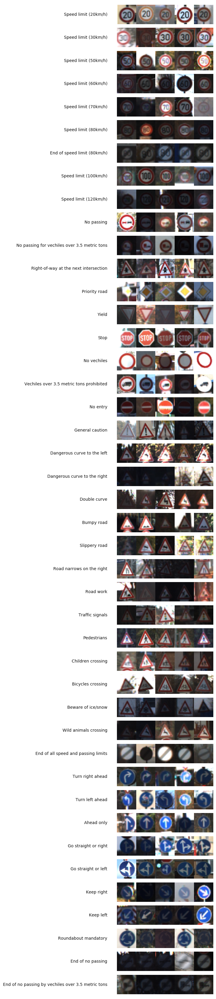

In [8]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.

# Print 5 images for every class
if not debug:
    sample_size = 5 # five images per class label
    count = 0 # book keeping for plots
    fig = plt.figure(figsize=(sample_size, n_classes))
    grid = gridspec.GridSpec(n_classes, sample_size + 1, wspace=0.0, hspace=0.0)
    for i in range(n_classes):
        ind = y_train == i
        subset_x = X_train[ind,] # get all images that belong to class i
        ax = plt.Subplot(fig, grid[count])
        ax.text(0.5, 0.5, y_labels[i], ha='right', va='center', size=10, alpha=.95)
        ax.set_xticks([])
        ax.set_yticks([])
        fig.add_subplot(ax)
        count += 1
        for x in range(sample_size):
            img = random.choice(subset_x) # randomly pick on image from class i
            ax = plt.Subplot(fig, grid[count])
            ax.set_xticks([])
            ax.set_yticks([])
            ax.imshow(img)
            fig.add_subplot(ax)
            count += 1

        # hide the borders
        if i == (n_classes - 1):
            all_axes = fig.get_axes()
            for ax in all_axes:
                for sp in ax.spines.values():
                    sp.set_visible(False)
    plt.show()

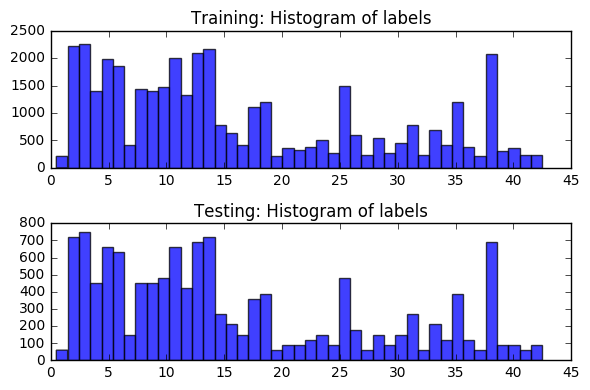

In [9]:
# Plot a histogram of labels
y_len = len(y_labels)

if not debug:
    train_plot = plt.subplot(211)
    train_plot.set_title("Training: Histogram of labels")
    train_plot.hist(y_train, y_len, align='right', alpha=0.75)
    test_plot = plt.subplot(212)
    test_plot.set_title("Testing: Histogram of labels")
    test_plot.hist(y_test, y_len, align='right', alpha=0.75)
    plt.tight_layout()
    plt.show()

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Your model can be derived from a deep feedforward net or a deep convolutional network.
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [10]:
### Preprocess the data here.
### Feel free to use as many code cells as needed.

# Normalize input between 0.1 and 0.9
def normalize_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    a = 0.1
    b = 0.9
    return a + img * (b - a) / 255

X_train = [normalize_image(img) for img in X_train]
X_test = [normalize_image(img) for img in X_test]

X_train = np.array(X_train)
X_test = np.array(X_test)

### One hot encoding is done after the split

### Question 1 

_Describe the techniques used to preprocess the data._

**Answer:**

To preprocess the data the images to YUV color space given that as in [Traffic Sign Recognition with Multi-Scale Convolutional Networks, Pierre Sermanet and Yann LeCun](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf) the best accuracy was achieved using Y channel. U and V channel were retained to add information about colors.

To improve convergence speed of sthocastic gradient descent, the images were scaled between 0.1 and 0.9

In [11]:
### Generate data additional (if you want to!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

# Split dataset: 75% training and 25% validation
train_features, valid_features, train_labels, valid_labels = train_test_split(
    X_train,
    y_train,
    test_size=0.25)

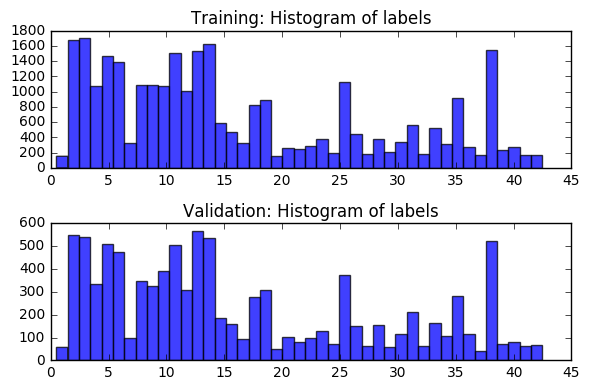

In [12]:
# Plot a histogram of recently splitted datasets to verify that
# classes are equally represented
y_len = len(y_labels)

if not debug:
    train_plot = plt.subplot(211)
    train_plot.set_title("Training: Histogram of labels")
    train_plot.hist(train_labels, y_len, align='right', alpha=0.75)
    test_plot = plt.subplot(212)
    test_plot.set_title("Validation: Histogram of labels")
    test_plot.hist(valid_labels, y_len, align='right', alpha=0.75)
    plt.tight_layout()
    plt.show()

In [13]:
# One-hot encode labels
encoder = LabelBinarizer()
encoder.fit(train_labels)
train_labels = encoder.transform(train_labels)
valid_labels = encoder.transform(valid_labels)
test_labels = encoder.transform(y_test)

### Question 2

_Describe how you set up the training, validation and testing data for your model. If you generated additional data, why?_

**Answer:**

The dataset was splitted using 75% of images for training and the other 25% for validation (where hyper parameters were tunned). Both subsets were randomized to mantanin the representativity of classes.

Testing dataset was used once, after training the model, to have a real approximation to the accuracy with non seen data.

There were no aditional data but, as we'll see later with custom images, that could have helped to balance the classes, which leads to more accurate predictions.

In [14]:
### Define your architecture here.
### Feel free to use as many code cells as needed.
from tensorflow.contrib.layers import flatten

features = tf.placeholder(tf.float32, shape=[None, image_shape[0], image_shape[1], image_shape[2]])
labels = tf.placeholder(tf.float32, shape=[None, n_classes])
keep_prob = tf.placeholder(tf.float32)

kernel_1 = [3, 3, 3, 32]
kernel_2 = [3, 3, 32, 64]

weights = {
    'conv_l_1': tf.Variable(tf.truncated_normal(kernel_1, stddev=0.01), name='conv_layer_1_weights'),
    'conv_l_2': tf.Variable(tf.truncated_normal(kernel_2, stddev=0.01), name='conv_layer_2_weights'),
    'fc_l_1': tf.Variable(tf.truncated_normal([6*6*64, 256], stddev=0.01), name='fc_layer_1_weights'),
    'fc_l_2': tf.Variable(tf.truncated_normal([256, n_classes], stddev=0.01), name='fc_layer_2_weights')
}

biases = {
    'conv_l_1': tf.Variable(tf.zeros(shape=[32]), name='conv_layer_1_biases'),
    'conv_l_2': tf.Variable(tf.zeros(shape=[64]), name='conv_layer_2_biases'),
    'fc_l_1': tf.Variable(tf.zeros(shape=[256]), name='fc_layer_1_biases'),
    'fc_l_2': tf.Variable(tf.zeros(shape=[n_classes]), name='fc_layer_2_biases')
}

# First convolution
conv_l_1 = tf.nn.conv2d(
    input=features, filter=weights['conv_l_1'],
    strides=[1, 1, 1, 1], padding='VALID') + biases['conv_l_1']
conv_l_1 = tf.nn.max_pool(value=conv_l_1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
conv_l_1 = tf.nn.relu(conv_l_1)

# Second convolution
conv_l_2 = tf.nn.conv2d(
    input=conv_l_1, filter=weights['conv_l_2'],
    strides=[1, 1, 1, 1], padding='VALID') + biases['conv_l_2']
conv_l_2 = tf.nn.max_pool(value=conv_l_2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
conv_l_2 = tf.nn.relu(conv_l_2)

# Flatten the layer
last_layer = conv_l_2
last_layer_shape = last_layer.get_shape()
num_features = last_layer_shape[1:4].num_elements()
layer_flat = tf.reshape(last_layer, [-1, num_features])

# First hidden layer
h_layer_1 = tf.add(tf.matmul(layer_flat, weights['fc_l_1']), biases['fc_l_1'])
h_layer_1 = tf.nn.relu(h_layer_1)
h_layer_1 = tf.nn.dropout(h_layer_1, keep_prob)

# Output layer
logits = tf.add(tf.matmul(h_layer_1, weights['fc_l_2']), biases['fc_l_2'])

In [15]:
# Prediction
prediction = tf.nn.softmax(logits)
prediction_label = tf.argmax(prediction, dimension=1)

# Cost Function
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits=logits, labels=labels)

# Regularization
beta = 5e-4
trainable_vars = tf.trainable_variables()
regularization = tf.add_n([tf.nn.l2_loss(tv) for tv in trainable_vars])

# Loss function
loss = tf.reduce_mean(cross_entropy) + beta * regularization

# Optimizer
optimizer = tf.train.AdamOptimizer().minimize(loss)

In [16]:
# Determine if the predictions are correct
is_correct_prediction = tf.equal(tf.argmax(prediction, 1), tf.argmax(labels, 1))

# Calculate the accuracy of the predictions
accuracy = tf.reduce_mean(tf.cast(is_correct_prediction, tf.float32))

In [17]:
# Feed dicts for training, validation, and test
train_feed_dict = {features: train_features, labels: train_labels, keep_prob: 1.0}
valid_feed_dict = {features: valid_features, labels: valid_labels, keep_prob: 1.0}
test_feed_dict = {features: X_test, labels: test_labels, keep_prob: 1.0}

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

The architecture is a Convolutional Neural Network (CNN), with two convolutional layers and two fully connected layers. Convolutional layers were filtered with a 3x3 non strided filter with 'valid' border. Max pooling takes a 2x2 filter. Convolutional and fully connected layers have a ReLu activation (to allow the model learn non linear relationships in the data).

There's a dropout after the first fully connected layer to make the network less prone to overfitting. The decision to use dropout was made after seeing that the validation accuracy and training accuracy had a gap of ~5%. Anyway, the use of droput is desirable even if there's no overfiting given that the dropout makes the newtork behave like an ensemble without the need to train several models.

Here's a diagram:

```
      LAYER         DATA DIMENSIONS

      Input  #####  (32, 32, 3)
Convolution   \|/
             #####  (30, 30, 32)
 MaxPooling  YYYYY
             #####  (15, 15, 32)
Convolution   \|/
             #####  (13, 13, 64)
 MaxPooling  YYYYY
             #####  (6, 6, 64)
    Flatten  |||||
             #####  (2304,)
      Dense  XXXXX
             #####  (256,)
    Dropout  |x|x|
             #####
      Dense  XXXXX
             #####  (43,)
    Softmax  #####  (43,)
```

In [18]:
### Train your model here.
### Feel free to use as many code cells as needed
session = tf.Session()
init = tf.initialize_all_variables()

# Start the session
session = tf.Session()
session.run(init)

In [19]:
train_size = len(train_features)
batch_size = 64
epoch_count = 0
epoch_log = 10

# Accounting
epochs_acc = []
loss_epoch = []
train_acc_epoch = []
valid_acc_epoch = []

In [20]:
# Define a function to train incrementaly
def train(epochs):
    global epoch_count

    for epoch_i in range(epochs):
        for start in range(0, train_size, batch_size):
            end = start + batch_size

            batch_features = train_features[start:end, :]
            batch_labels = train_labels[start:end, :]

            # Run optimizer and get loss
            _, l = session.run(
                [optimizer, loss],
                feed_dict={features: batch_features, labels: batch_labels, keep_prob: 0.5})

        # Calculate Training and Validation accuracy
        training_accuracy = session.run(accuracy, feed_dict=train_feed_dict)
        validation_accuracy = session.run(accuracy, feed_dict=valid_feed_dict)

        # Log epochs
        epochs_acc.append(epoch_count)
        loss_epoch.append(l)
        train_acc_epoch.append(training_accuracy)
        valid_acc_epoch.append(validation_accuracy)

        if debug or epoch_count % epoch_log == 0:
            print('Epoch {} - Training accuracy:   {}'.format(epoch_count, training_accuracy))
            print('Epoch {} - Validation accuracy: {}'.format(epoch_count, validation_accuracy))

        epoch_count += 1

In [21]:
 train(100)

Epoch 0 - Training accuracy:   0.17812691628932953
Epoch 0 - Validation accuracy: 0.1864735335111618
Epoch 10 - Training accuracy:   0.9586818814277649
Epoch 10 - Validation accuracy: 0.9430786371231079
Epoch 20 - Training accuracy:   0.9858872294425964
Epoch 20 - Validation accuracy: 0.9768438339233398
Epoch 30 - Training accuracy:   0.9935387372970581
Epoch 30 - Validation accuracy: 0.9853106141090393
Epoch 40 - Training accuracy:   0.9959872364997864
Epoch 40 - Validation accuracy: 0.9878608584403992
Epoch 50 - Training accuracy:   0.9966673254966736
Epoch 50 - Validation accuracy: 0.9880648851394653
Epoch 60 - Training accuracy:   0.997449517250061
Epoch 60 - Validation accuracy: 0.9910231828689575
Epoch 70 - Training accuracy:   0.9977555871009827
Epoch 70 - Validation accuracy: 0.989391028881073
Epoch 80 - Training accuracy:   0.9978575706481934
Epoch 80 - Validation accuracy: 0.9901050925254822
Epoch 90 - Training accuracy:   0.998843789100647
Epoch 90 - Validation accuracy: 0.9

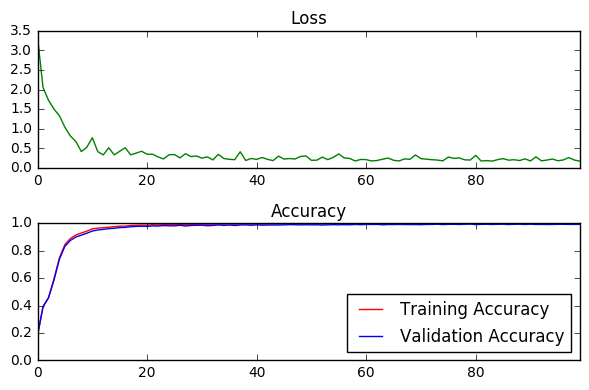

Validation accuracy at 0.9916352033615112


In [22]:
# Graph training evolution: loss and accuracy
loss_plot = plt.subplot(211)
loss_plot.set_title('Loss')
loss_plot.plot(epochs_acc, loss_epoch, 'g')
loss_plot.set_xlim([epochs_acc[0], epochs_acc[-1]])
acc_plot = plt.subplot(212)
acc_plot.set_title('Accuracy')
acc_plot.plot(epochs_acc, train_acc_epoch, 'r', label='Training Accuracy')
acc_plot.plot(epochs_acc, valid_acc_epoch, 'b', label='Validation Accuracy')
acc_plot.set_ylim([0, 1.0])
acc_plot.set_xlim([epochs_acc[0], epochs_acc[-1]])
acc_plot.legend(loc=4)
plt.tight_layout()
plt.show()

# Check accuracy against Validation data
validation_accuracy = session.run(accuracy, feed_dict=valid_feed_dict)
print('Validation accuracy at {}'.format(validation_accuracy))

In [23]:
# Save the model for later use
if save_model:
    saver = tf.train.Saver()
    saver.save(session, 'model.ckpt')

In [24]:
# Compute accuracy for testing data
test_accuracy = session.run(accuracy, feed_dict=test_feed_dict)
print('Test accuracy at {}'.format(test_accuracy))

Test accuracy at 0.9505146741867065


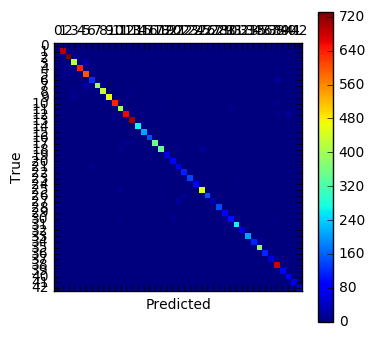

In [25]:
if not debug:
    # Compute the confusion matrix
    pred_test = session.run(prediction_label, feed_dict=test_feed_dict)
    cm = confusion_matrix(y_true=y_test, y_pred=pred_test)

    # Print the confusion matrix
    plt.matshow(cm)
    plt.colorbar()
    tick_marks = np.arange(n_classes)
    plt.xticks(tick_marks, range(n_classes))
    plt.yticks(tick_marks, range(n_classes))
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

The chosen optimizer is Adam over Stochastic Gradient Descent given that Adam has an adaptive learning rate.

Batch size was set to 64 given that it is possible to run it on limited hardware without GPU.

Weights were initialized with a truncated normal distribution with standard deviation of 0.01 because the default, 0.1, caused the gradient to vanished.

The CNN was trained with 100 epochs (a feature to explore is to implement an early stopping mechanism to avoid overfiting). This architecture achieved 95% accuracy on testing set (non seen data).

In the consufion matrix we can see that the majority of the errors were made on the firsts classes, and a possible explanation to that is that they are all the speed signs, which are very similar in shape and colors.

### Question 5


_What approach did you take in coming up with a solution to this problem?_

**Answer:**

To train the model I started with a simple fully connected network and a small subset of the dataset. After that, I trained the network to overfit the data and used the output tweak hyperparameters, improve functions, etc. Then I built the helper functions like plottings, predictions, etc.

After a few iteration, when I was comfortable with the environment created, I changed the fully connected network to a CNN and started to train with the whole dataset, training and validation (which I used to tune the hyper parameters). After a few iterations changing convolutional filters, layer sizes, etc, I was happy with the model and just then I tested on test set to measure the accuracy on non seen data. The process of hyper parameters tuning was a manual grid search, were I established the parameters ranges and started to try (and stop earlier if things weren't as I'd supposed). This way I had an heuristic to follow and not waste my processing resources.

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [26]:
# Plot custom signs
def plot_custom_images(images, pred_labels, y_labels, shape=(1, 5)):
    r, c = shape[0], shape[1]
    fig, axes = plt.subplots(r, c, figsize=(32, 32), subplot_kw={'xticks': [], 'yticks': []})
    fig.subplots_adjust(hspace=0.3, wspace=0.05)

    for ax, img, s_class in zip(axes.flat, images, pred_labels):
        ax.imshow(img)
        ax.set_title(y_labels[s_class])
        ax.title.set_fontsize(20)

    plt.show()

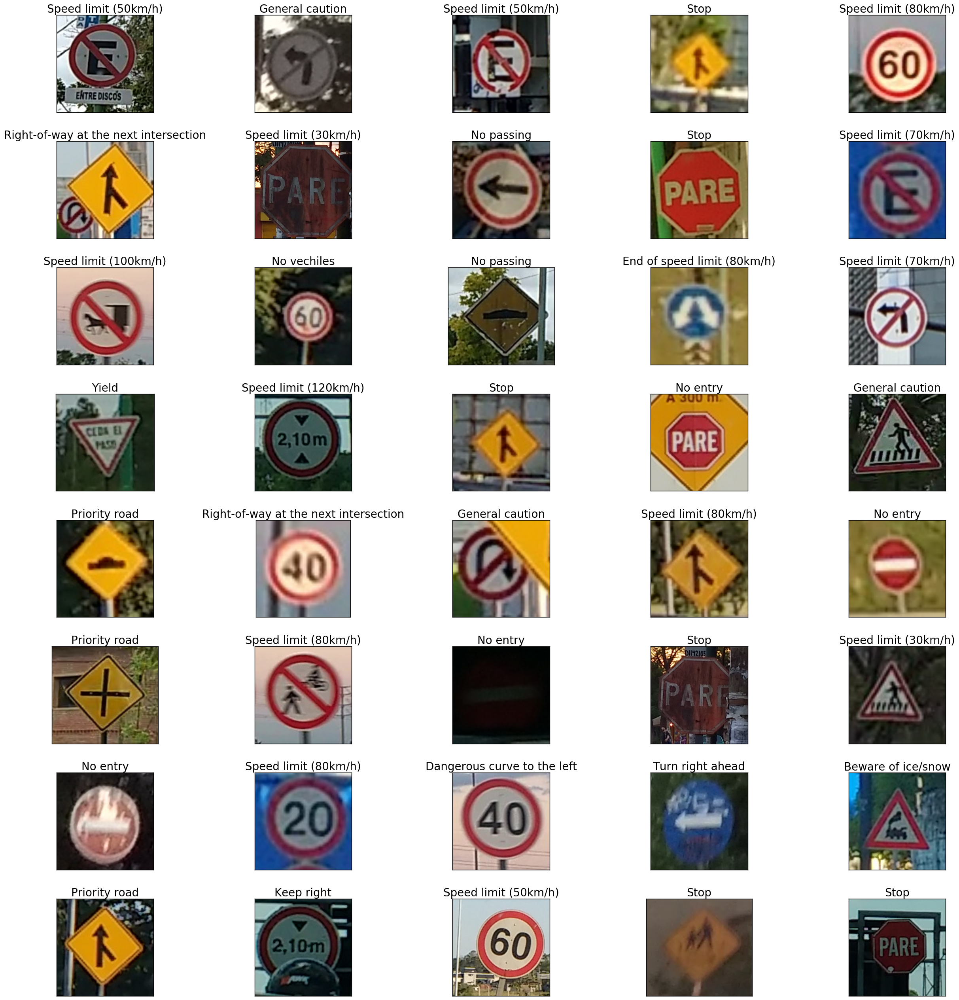

In [27]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.
custom_features = []
for image_name in os.listdir("custom/"):
    image = cv2.imread("custom/" + image_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    custom_features.append(image)

#  Standarize and resize the images
custom_features_std = [cv2.resize(normalize_image(image), (32, 32)) for image in custom_features]    

custom_feed_dict = {features: np.array(custom_features_std), keep_prob: 1.0}

# Predict custom images
prediction_custom = session.run(prediction, feed_dict=custom_feed_dict)
pred_label_custom = session.run(prediction_label, feed_dict=custom_feed_dict)
logits_custom = session.run(logits, feed_dict=custom_feed_dict)

# Plot images
plot_custom_images(custom_features, pred_label_custom, y_labels, shape=(8, 5))

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It would be helpful to plot the images in the notebook._



**Answer:**

The images selected were taken around my neighbourhood and are according to the argentinian law. Having that, it's understandable that some signs are not recognized well because they weren't on the training dataset. Besides that, the images from the dataset seems to have lower quality that the ones taken from me (German dataset looks blurry and with lots of bright intensities, and mine is clearer and with, almost, the same bright intensity).

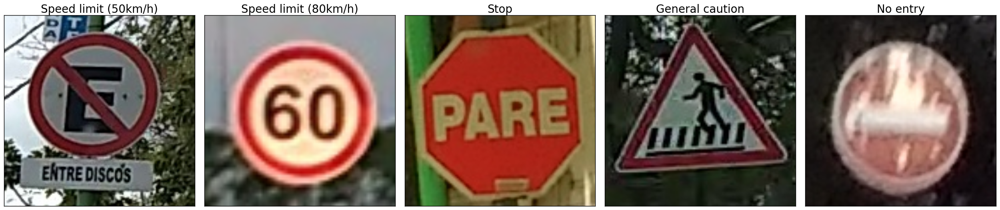

In [28]:
### Run the predictions here.
### Feel free to use as many code cells as needed.

# Pick five signs
selected = [0, 4, 8, 19, 30]

features_custom_subset = [custom_features[i] for i in selected]
prediction_custom_subset = [prediction_custom[i] for i in selected]
pred_label_custom_subset = [pred_label_custom[i] for i in selected]
logits_custom_subset = [logits_custom[i] for i in selected]

# Plot selected signs
plot_custom_images(features_custom_subset, pred_label_custom_subset, y_labels)

### Question 7

_Is your model able to perform equally well on captured pictures or a live camera stream when compared to testing on the dataset?_


**Answer:**

I think that the model made a pretty good work on this examples:

* Sign 1 is for "Not Parking" (the E is for "Estacionamiento"). This sign was predicted as "Speed limit 50km/h" which have th same shape and colors (circular, white background and red border).
* Sign 2 is for "Speed limit 60km/h". It was missclasified as "Speed limit 80km/h" and if you see the dataset, the 6 used in Argentina is more rounded, almost closed (like an 8) and the 6 in the dataset are not rounded and the white gap is wider. Almost a hit :-(
* Sign 3 is for "Stop". Yay! Even though it says "PARE" (Stop in spanish) it was perfectly classified. On the other hand, some argentinian's "Stop" sign were classified as "No entry" (Which indeed are very similar if you can't understand what it says, the word PARE is classified as the white band in the "No entry" sign)
* Sign 4 is for "Pedestrian crossing". It was classified as "General caution". The shape is very similar, a triangle with white background, red border and something black inside.
* Sign 5 is for "No entry". It was perfectly classified even though it is very damaged.

Anyway, it can't be used on production without training with the new signs, but it seems that is generalizing quite well.

If you want to messure hard numbers, I don't think that the performance of the model on training dataset can be compared with the performance on the captured images by two main reasons:

1) The captured dataset is very small compared to the training / validation dataset
2) Most of the true labels on the captured dataset are non existant on the training / validation dataset.

But we can have an aproximation to the accuracy of the model on new images if see the accuracy on testing dataset, given that testing dataset is composed by images never seen by the model in any of the phases of training or validation. The model performed +99% on training and validation, and +95%.

Given this number, it's expected the model to recognize 95 of each 100 traffic signs if the conditions are kept (same camera, same traffic signs, etc). To apply this model on others traffic signs (like the argentinian ones) it should be re-trained (maybe using transfer learning) using the new signs.

In [29]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.
n_top = 3
predictions = tf.placeholder(tf.float32)
top_k = tf.nn.top_k(predictions, k=n_top)
top_k_dict = {predictions: np.array(prediction_custom_subset)}

In [30]:
top_k_custom = session.run(top_k, feed_dict=top_k_dict)

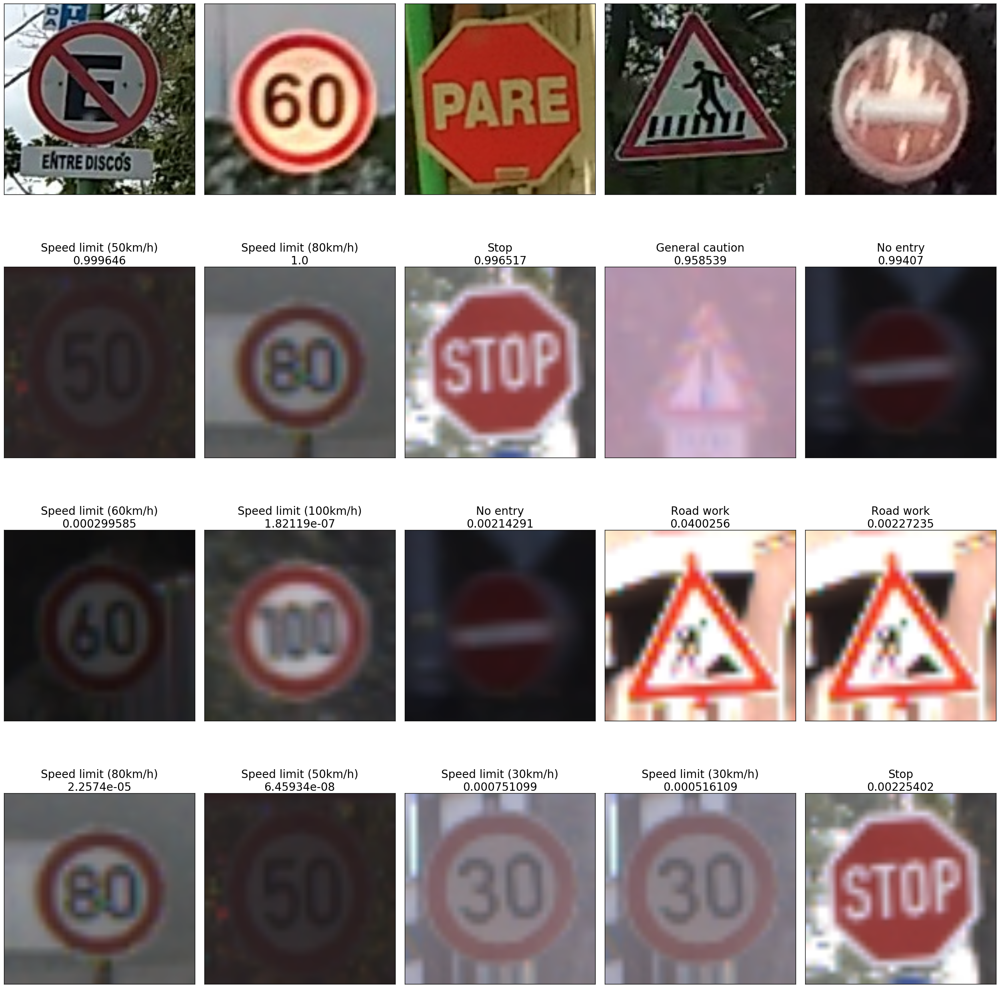

In [31]:
n_signs = len(features_custom_subset)
fig, axarr = plt.subplots(1 + n_top, n_signs, figsize=(32, 32), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.3, wspace=0.05)

for i in range(n_signs):
    for j in range(n_top):
        lblidx = top_k_custom.indices[i][j]
        sftmx  = top_k_custom.values[i][j]
        title  = str(y_labels[lblidx]) + "\n" + str(sftmx)
        axarr[0,   i].imshow(features_custom_subset[i])
        axarr[1+j, i].imshow(y_labels_img[lblidx])
        axarr[1+j, i].set_title(title)
        axarr[1+j, i].title.set_fontsize(20)

plt.show()

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.11/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*


**Answer:**

In all cases the model was pretty confident (0.99+) except in the fourth (0.95).

The first sign wasn't in the dataset so it's OK to miss that, but the second sign was wrongly classified as "Speed limit 80km/h" with a very high confidence (~1.0) and the true label didn't appeared on the top 3: that's really bad.

The third sign was correctly classified, with high confidence.

Fourth sign was wrongly classfied but the true label wasn't in the dataset. The confidence wasn't as high as the previous examples but it did recognize the shape and colors. Good.

The fifth sign was correctly classified with high confidence too.

The model did a quite good job, with a new dataset and a little more training I'm sure it can recognize the new signs.

*Softmax values were displayed below the Predicted label, which is accompanied by an image of that label. I think this way we can appretiate better what the model is seeing*

### Question 9
_If necessary, provide documentation for how an interface was built for your model to load and classify newly-acquired images._


**Answer:**

To gather the images I recorded videos from the inside of my car and then analized frame by frame with a video software (linux ~$ convert video.mp4 video.jpg).

After selecting the frames, I cropped the images in squares and saved them for later processing. The squares were of a variety of sizes.

Inside the preprocessing pipeline I resized the images to fit the what the model was expecting, and then I fed the images to the model, from where I got the predictions.

With this same approach a sliding window can be built, were a windows slides over the frame to detect were traffic signs are, and the send that patch to the traffic sign classifier.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In [32]:
session.close()